# **Notebook 2b**: Viewing Angle

<span style="font-size: 1.5rem;">By **Ben Taliana**</span>

## Section 0: Notebook Metadata and Configuration

**Student:** Ben Taliana  
**Course:** ARI3129 - Advanced Computer Vision for AI  
**Task:** 2b - Attribute Classification (Viewing Angle)  
**Selected Detector:** Faster R-CNN (from 2a detectors)  
**Architecture:** Faster R-CNN with ResNet-50-FPN backbone  
**Framework:** PyTorch (torchvision.models)  
**Attribute:** Viewing Angle (Back, Front, Side)

### Reproducibility
- Fixed seed: 3129
- Deterministic: torch.backends.cudnn.deterministic = True
- Minimal augmentation (photometric only, no geometric transforms)

In [ ]:
# Configuration Constants
SEED = 3129
NUM_CLASSES = 3  # Back, Front, Side
EPOCHS = 8
BATCH_SIZE = 8  
LEARNING_RATE = 0.005
MOMENTUM = 0.9
WEIGHT_DECAY = 0.0005
IMAGE_SIZE = 520  # Target image size for training
GRADIENT_CLIP = 1.0 

# Annotations and images in different locations
ANN_ROOT = "dataset/COCO-based_COCO_view_angle"
IMG_ROOT = "dataset/COCO-based_COCO"

TRAIN_ANN = f"{ANN_ROOT}/annotations/train.json"
VAL_ANN = f"{ANN_ROOT}/annotations/val.json"
TEST_ANN = f"{ANN_ROOT}/annotations/test.json"

TRAIN_IMG = f"{IMG_ROOT}/images/train"
VAL_IMG = f"{IMG_ROOT}/images/val"
TEST_IMG = f"{IMG_ROOT}/images/test"

OUTPUT_DIR = "work_dirs/faster_rcnn_viewing_angle"

# Class names 
CLASS_NAMES = [
    "Back",   # Category ID 1
    "Front",  # Category ID 2
    "Side"    # Category ID 3
]

## Section 1: Environment Setup (PyTorch + Logging)

This section imports required libraries, prints environment information, and sets up reproducibility.

In [2]:
import torch
import torchvision
from torchvision.models.detection import (
    fasterrcnn_resnet50_fpn, 
    FasterRCNN_ResNet50_FPN_Weights  
)
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor  

from torchvision import transforms as T
import torch.utils.data
import torch.optim as optim
from torch.utils.tensorboard import SummaryWriter
from tensorboard.backend.event_processing import event_accumulator


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import json
import os
import time
import random
from pathlib import Path
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

c:\Users\benja\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
# Set style
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (12, 8)

# Print environment info
print("ENVIRONMENT INFORMATION")
print(f"PyTorch version: {torch.__version__}")
print(f"Torchvision version: {torchvision.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"CUDA version: {torch.version.cuda}")
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"GPU memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Set seeds for reproducibility
def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(SEED)
print(f"\nRandom seed set to: {SEED}")

# Create output directory
os.makedirs(OUTPUT_DIR, exist_ok=True)
print(f"Output directory: {OUTPUT_DIR}")

ENVIRONMENT INFORMATION
PyTorch version: 2.2.1+cu121
Torchvision version: 0.17.1+cu121
CUDA available: True
CUDA version: 12.1
GPU: NVIDIA GeForce RTX 3070 Ti Laptop GPU
GPU memory: 8.59 GB
Using device: cuda

Random seed set to: 3129
Output directory: work_dirs/faster_rcnn_viewing_angle


## Section 2: Dataset Validation

This section validates dataset paths, loads COCO annotations, builds category ID mappings, and visualizes ground truth samples.

In [4]:
print("DATASET VALIDATION")

# Validate paths exist
paths_to_check = [
    (TRAIN_ANN, "Train annotations"),
    (VAL_ANN, "Val annotations"),
    (TEST_ANN, "Test annotations"),
    (TRAIN_IMG, "Train images"),
    (VAL_IMG, "Val images"),
    (TEST_IMG, "Test images")
]

all_exist = True
for path, desc in paths_to_check:
    exists = os.path.exists(path)
    status = "OK" if exists else "MISSING"
    print(f"{status} {desc}: {path}")
    if not exists:
        all_exist = False

if not all_exist:
    raise FileNotFoundError("Some dataset paths are missing!")

print("\nAll paths validated successfully")

# Load COCO annotations
print("\nLoading COCO annotations...")
coco_train = COCO(TRAIN_ANN)
coco_val = COCO(VAL_ANN)
coco_test = COCO(TEST_ANN)

# Print dataset statistics
print("\nDATASET STATISTICS")
print(f"Train: {len(coco_train.imgs)} images, {len(coco_train.anns)} annotations")
print(f"Val:   {len(coco_val.imgs)} images, {len(coco_val.anns)} annotations")
print(f"Test:  {len(coco_test.imgs)} images, {len(coco_test.anns)} annotations")

# Build category ID mapping 
# COCO category IDs might not be contiguous
cat_ids = sorted(coco_train.getCatIds())
cat_id_to_contiguous = {cat_id: idx + 1 for idx, cat_id in enumerate(cat_ids)}
contiguous_to_cat_id = {idx + 1: cat_id for idx, cat_id in enumerate(cat_ids)}

print("\nCATEGORY ID MAPPING")
print("COCO ID -> Contiguous ID -> Name")
for cat_id in cat_ids:
    cont_id = cat_id_to_contiguous[cat_id]
    name = coco_train.cats[cat_id]['name']
    print(f"  {cat_id} -> {cont_id} -> {name}")

DATASET VALIDATION
OK Train annotations: dataset/COCO-based_COCO_view_angle/annotations/train.json
OK Val annotations: dataset/COCO-based_COCO_view_angle/annotations/val.json
OK Test annotations: dataset/COCO-based_COCO_view_angle/annotations/test.json
OK Train images: dataset/COCO-based_COCO/images/train
OK Val images: dataset/COCO-based_COCO/images/val
OK Test images: dataset/COCO-based_COCO/images/test

All paths validated successfully

Loading COCO annotations...
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!

DATASET STATISTICS
Train: 483 images, 527 annotations
Val:   88 images, 92 annotations
Test:  86 images, 93 annotations

CATEGORY ID MAPPING
COCO ID -> Contiguous ID -> Name
  1 -> 1 -> Back
  2 -> 2 -> Front
  3 -> 3 -> Side



Visualizing 2 ground truth sample(s):


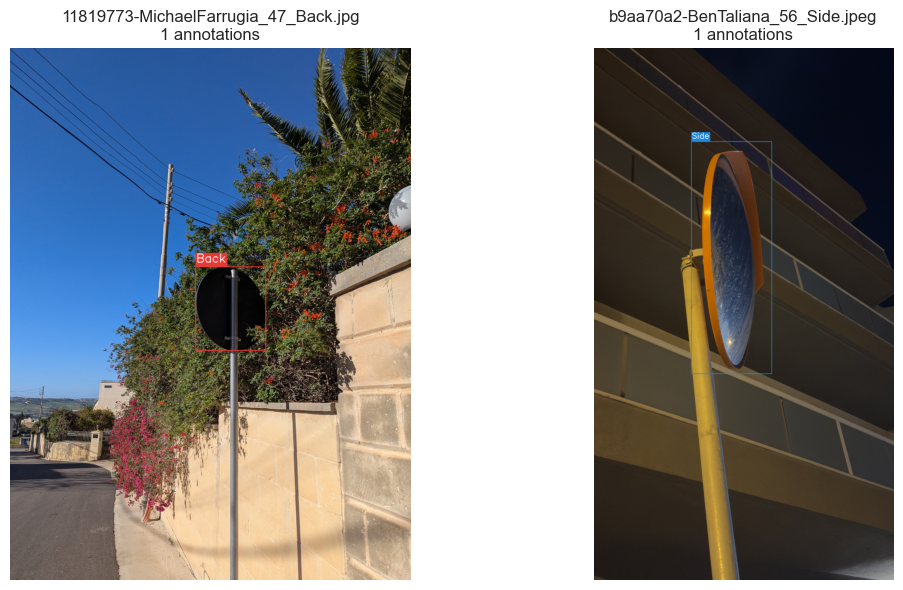

Ground truth samples saved


In [ ]:
# Sanity check: Visualize 2 sample images with GT boxes
def visualize_gt_samples(coco, img_dir, num_samples=2):
    print(f"\nVisualizing {num_samples} ground truth sample(s):")

    # Color mapping for viewing angles (BGR format for OpenCV)
    color_map = {
        "Back": (53, 57, 229),      # Red tones (BGR)
        "Front": (71, 160, 67),     # Green tones (BGR)
        "Side": (229, 136, 30)      # Blue tones (BGR)
    }

    img_ids = list(coco.imgs.keys())
    sample_ids = random.sample(img_ids, num_samples)

    fig, axes = plt.subplots(1, num_samples, figsize=(12, 6))
    if num_samples == 1:
        axes = [axes]

    for idx, img_id in enumerate(sample_ids):
        img_info = coco.loadImgs(img_id)[0]
        img_path = os.path.join(img_dir, img_info['file_name'])

        # Load image
        img = cv2.imread(img_path)
        if img is None:
            print(f"Warning: Could not read {img_path}")
            continue

        # Get annotations
        ann_ids = coco.getAnnIds(imgIds=img_id)
        anns = coco.loadAnns(ann_ids)

        # Draw GT boxes with category-specific colors 
        for ann in anns:
            x, y, w, h = ann['bbox']
            cat_name = coco.cats[ann['category_id']]['name']
            
            # Get color for this category 
            color_bgr = color_map.get(cat_name, (255, 255, 255))

            # Draw very thick rectangle with category color
            cv2.rectangle(img, (int(x), int(y)), (int(x+w), int(y+h)), color_bgr, 6)
            
            # Draw label with background
            label_text = cat_name
            font = cv2.FONT_HERSHEY_SIMPLEX
            font_scale = 3
            font_thickness = 5
            
            # Get text size for background
            (text_width, text_height), baseline = cv2.getTextSize(
                label_text, font, font_scale, font_thickness
            )
            
            # Clamp text position to avoid going out of bounds at top edge
            y1 = int(y)
            y_text_top = max(text_height + baseline + 12, y1)
            
            # Draw background rectangle for text 
            cv2.rectangle(
                img, 
                (int(x), y_text_top - text_height - baseline - 10),
                (int(x) + text_width + 12, y_text_top),
                color_bgr, 
                -1  # Filled rectangle
            )
            
            # Draw text on top of background 
            cv2.putText(
                img, label_text, 
                (int(x) + 6, y_text_top - baseline - 5),
                font, font_scale, (255, 255, 255), font_thickness
            )

        # Convert BGR to RGB only for display
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        axes[idx].imshow(img_rgb)
        axes[idx].set_title(f"{img_info['file_name']}\n{len(anns)} annotations")
        axes[idx].axis('off')

    plt.tight_layout()
    plt.savefig(f"{OUTPUT_DIR}/gt_samples.png", dpi=250)
    plt.show()
    print("Ground truth samples saved")

random.seed(SEED + 1)
visualize_gt_samples(coco_train, TRAIN_IMG, num_samples=2)

## Section 3: Model Setup and Configuration

In [ ]:
class COCODataset(torch.utils.data.Dataset):
    def __init__(self, root, annotation, cat_id_to_contiguous, transforms=None, target_size=520):
        self.root = root
        self.coco = COCO(annotation)
        self.ids = list(sorted(self.coco.imgs.keys()))
        self.cat_id_to_contiguous = cat_id_to_contiguous
        self.transforms = transforms
        self.target_size = target_size

    def __getitem__(self, index):
        coco = self.coco
        img_id = self.ids[index]
        ann_ids = coco.getAnnIds(imgIds=img_id)
        anns = coco.loadAnns(ann_ids)

        # Load image
        path = coco.loadImgs(img_id)[0]['file_name']
        img_path = os.path.join(self.root, path)
        img = cv2.imread(img_path)
        if img is None:
            raise FileNotFoundError(f"Could not read image: {img_path}")
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Get original size BEFORE transform
        orig_h, orig_w = img.shape[:2]

        # Parse annotations
        boxes = []
        labels = []
        areas = []
        for ann in anns:
            x, y, w, h = ann['bbox']
            if w <= 0 or h <= 0:  # Add validation
                continue
            boxes.append([x, y, x+w, y+h])
            labels.append(self.cat_id_to_contiguous[ann['category_id']])
            areas.append(ann['area'])

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64)
        
        # Scale boxes to target size
        scale_x = self.target_size / orig_w
        scale_y = self.target_size / orig_h
        boxes[:, [0, 2]] *= scale_x
        boxes[:, [1, 3]] *= scale_y
        
        area = torch.as_tensor(areas, dtype=torch.float32) * scale_x * scale_y

        image_id = torch.tensor([img_id])
        iscrowd = torch.zeros((len(anns),), dtype=torch.int64)

        target = {
            "boxes": boxes,
            "labels": labels,
            "image_id": image_id,
            "area": area,
            "iscrowd": iscrowd
        }

        # Apply transforms
        if self.transforms:
            img = self.transforms(img)

        return img, target

    def __len__(self):
        return len(self.ids)

# Transforms with resizing for speed
train_transforms = T.Compose([
    T.ToPILImage(),
    T.Resize((520, 520)),  
    T.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    T.ToTensor()
])

test_transforms = T.Compose([
    T.ToPILImage(),
    T.Resize((520, 520)),  
    T.ToTensor()
])

# Create datasets
dataset_train = COCODataset(TRAIN_IMG, TRAIN_ANN, cat_id_to_contiguous, transforms=train_transforms)
dataset_val = COCODataset(VAL_IMG, VAL_ANN, cat_id_to_contiguous, transforms=test_transforms)
dataset_test = COCODataset(TEST_IMG, TEST_ANN, cat_id_to_contiguous, transforms=test_transforms)

# Data loaders with speed optimizations
def collate_fn(batch):
    return tuple(zip(*batch))

data_loader_train = torch.utils.data.DataLoader(
    dataset_train, batch_size=BATCH_SIZE, shuffle=True,
    num_workers=0,
    pin_memory=(device.type == "cuda"),
    collate_fn=collate_fn
)

data_loader_val = torch.utils.data.DataLoader(
    dataset_val, batch_size=1, shuffle=False,
    num_workers=0,
    pin_memory=(device.type == "cuda"),
    collate_fn=collate_fn
)

print(f"Train batches: {len(data_loader_train)}")
print(f"Val batches: {len(data_loader_val)}")
print(f"Image size: {IMAGE_SIZE}x{IMAGE_SIZE}")

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Train batches: 61
Val batches: 88
Image size: 520x520 (resized for speed)


In [7]:
print("MODEL CONFIGURATION")

# Load with COCO pretrained weights (NEW API)
weights = FasterRCNN_ResNet50_FPN_Weights.COCO_V1
model = fasterrcnn_resnet50_fpn(weights=weights)

print(f"Loaded pretrained weights: {weights}")
print(f"Weights trained on 80 COCO classes")

# Replace classification head for our 3 viewing angle classes
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, NUM_CLASSES + 1)

print(f"Replaced box predictor: {NUM_CLASSES} classes + background")
print(f"  - Background: class 0")
print(f"  - Back: class 1")
print(f"  - Front: class 2")
print(f"  - Side: class 3")

# Move entire model to GPU
model = model.to(device)

# Verify model is on GPU
model_device = next(model.parameters()).device
head_device = next(model.roi_heads.box_predictor.parameters()).device

print(f"\nDevice Verification:")
print(f"  Target device: {device}")
print(f"  Model device: {model_device}")
print(f"  Head device: {head_device}")

if device.type == 'cuda' and str(model_device) != "cuda:0":
    raise RuntimeError(f"ERROR: Model on {model_device}, not GPU!")

# VERIFY
print("\nVerifying pretrained weights...")
model.eval()
with torch.no_grad():
    test_img = torch.randn(3, 800, 800, device=device)
    test_output = model([test_img])
    num_detections = len(test_output[0]['boxes'])
    print(f"Pretrained model detected {num_detections} objects in random noise")
    print(f"This confirms weights are loaded (should detect ~50-200 objects)")
    
    if num_detections < 10:
        print("Very few detections - weights might not be loaded!")
    elif num_detections > 10:
        print("Pretrained weights confirmed!")

model.train()

# Optimizer & Scheduler
params = [p for p in model.parameters() if p.requires_grad]
optimizer = optim.SGD(params, lr=LEARNING_RATE, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)

# Learning rate scheduler
lr_scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)

print(f"\nModel Configuration:")
print(f"  Architecture: Faster R-CNN ResNet-50-FPN")
print(f"  Pretrained: COCO (80 classes)")
print(f"  Fine-tuning for: {NUM_CLASSES} classes + background")
print(f"  Optimizer: SGD (lr={LEARNING_RATE}, momentum={MOMENTUM})")
print(f"  Scheduler: StepLR (step_size=5, gamma=0.1)")
print(f"  Batch size: {BATCH_SIZE}")
print(f"  Epochs: {EPOCHS}")

# TensorBoard setup
writer = SummaryWriter(log_dir=f"{OUTPUT_DIR}/tensorboard")
print(f"\nTensorBoard logging enabled")
print(f"To view logs, run:")
print(f"      tensorboard --logdir {OUTPUT_DIR}/tensorboard")

MODEL CONFIGURATION
Loaded pretrained weights: FasterRCNN_ResNet50_FPN_Weights.COCO_V1
Weights trained on 80 COCO classes
Replaced box predictor: 3 classes + background
  - Background: class 0
  - Back: class 1
  - Front: class 2
  - Side: class 3

Device Verification:
  Target device: cuda
  Model device: cuda:0
  Head device: cuda:0

Verifying pretrained weights...
Pretrained model detected 100 objects in random noise
This confirms weights are loaded (should detect ~50-200 objects)
Pretrained weights confirmed!

Model Configuration:
  Architecture: Faster R-CNN ResNet-50-FPN
  Pretrained: COCO (80 classes)
  Fine-tuning for: 3 classes + background
  Optimizer: SGD (lr=0.005, momentum=0.9)
  Scheduler: StepLR (step_size=5, gamma=0.1)
  Batch size: 8
  Epochs: 8

TensorBoard logging enabled
To view logs, run:
      tensorboard --logdir work_dirs/faster_rcnn_viewing_angle/tensorboard


## Section 4: Training

This section trains the Faster R-CNN model with component loss logging and validation monitoring.

In [8]:
def train_one_epoch(model, optimizer, data_loader, device, epoch, writer):
    model.train()

    total_loss = 0
    total_loss_classifier = 0
    total_loss_box_reg = 0

    for i, (images, targets) in enumerate(data_loader):
        images = [img.to(device, non_blocking=True) for img in images]
        targets = [{k: v.to(device, non_blocking=True) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)

        # Extract component losses
        loss_classifier = loss_dict.get('loss_classifier', torch.tensor(0.0))
        loss_box_reg = loss_dict.get('loss_box_reg', torch.tensor(0.0))
        losses = sum(loss for loss in loss_dict.values())

        # NaN/Inf check
        if not torch.isfinite(losses):
            print(f"NaN/Inf loss detected at iter {i}, skipping batch")
            continue

        optimizer.zero_grad()
        losses.backward()
        
        # Gradient clipping
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=GRADIENT_CLIP)
        
        optimizer.step()

        total_loss += losses.item()
        total_loss_classifier += loss_classifier.item()
        total_loss_box_reg += loss_box_reg.item()

        if i % 50 == 0:
            print(f"Epoch {epoch+1}/{EPOCHS}, Iter {i}/{len(data_loader)}, Loss: {losses.item():.4f}")

    # Average losses
    avg_loss = total_loss / len(data_loader)
    avg_loss_classifier = total_loss_classifier / len(data_loader)
    avg_loss_box_reg = total_loss_box_reg / len(data_loader)

    # Log to TensorBoard
    writer.add_scalar('Loss/train_total', avg_loss, epoch)
    writer.add_scalar('Loss/train_classifier', avg_loss_classifier, epoch)
    writer.add_scalar('Loss/train_box_reg', avg_loss_box_reg, epoch)
    
    # Log learning rate
    current_lr = optimizer.param_groups[0]["lr"]
    writer.add_scalar('lr', current_lr, epoch)

    return avg_loss

@torch.no_grad()
def evaluate(model, data_loader, device, contiguous_to_cat_id):
    model.eval()
    results = []

    for images, targets in data_loader:
        images_gpu = list(img.to(device, non_blocking=True) for img in images)
        outputs = model(images_gpu)

        for target, output, img in zip(targets, outputs, images):
            image_id = target['image_id'].item()
            
            # Get original image size from COCO
            img_info = data_loader.dataset.coco.loadImgs(image_id)[0]
            orig_w = img_info['width']
            orig_h = img_info['height']
            
            # Scale factors (from 520x520 back to original)
            scale_x = orig_w / 520
            scale_y = orig_h / 520
            
            boxes = output['boxes'].cpu().numpy()
            scores = output['scores'].cpu().numpy()
            labels = output['labels'].cpu().numpy()

            for box, score, label in zip(boxes, scores, labels):
                # Filter very low confidence predictions
                if score < 0.01:
                    continue
                
                # Scale boxes back to original image size
                x1, y1, x2, y2 = box
                x1 = x1 * scale_x
                y1 = y1 * scale_y
                x2 = x2 * scale_x
                y2 = y2 * scale_y
                
                # Convert to COCO format [x, y, width, height]
                x = float(x1)
                y = float(y1)
                w = float(x2 - x1)
                h = float(y2 - y1)
                
                # Convert contiguous label back to COCO category_id
                coco_cat_id = contiguous_to_cat_id[int(label)]
                
                results.append({
                    'image_id': int(image_id),
                    'category_id': int(coco_cat_id),
                    'bbox': [x, y, w, h],
                    'score': float(score)
                })

    return results

In [9]:
print("TRAINING STARTED")

start_time = time.time()
best_map = 0.0
best_epoch = 0

for epoch in range(EPOCHS):
    print(f"\nEpoch {epoch+1}/{EPOCHS}")

    # Train
    train_loss = train_one_epoch(model, optimizer, data_loader_train, device, epoch, writer)
    print(f"Training loss: {train_loss:.4f}")

    # Validate
    val_results = evaluate(model, data_loader_val, device, contiguous_to_cat_id)

    # Handle empty results 
    if len(val_results) == 0:
        print("No detections on validation set, setting mAP=0.0")
        val_map = 0.0
    else:
        try:
            coco_dt = coco_val.loadRes(val_results)
            coco_eval = COCOeval(coco_val, coco_dt, 'bbox')
            coco_eval.evaluate()
            coco_eval.accumulate()
            coco_eval.summarize()
            val_map = coco_eval.stats[0]
        except Exception as e:
            print(f"Evaluation failed: {e}")
            val_map = 0.0

    writer.add_scalar('mAP/val', val_map, epoch)
    print(f"Validation mAP: {val_map:.4f}")

    # LR scheduler step
    lr_scheduler.step()

    # Save checkpoints
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'train_loss': train_loss,
        'val_map': val_map
    }

    torch.save(checkpoint, f"{OUTPUT_DIR}/last.pth")

    if val_map > best_map:
        best_map = val_map
        best_epoch = epoch
        torch.save(checkpoint, f"{OUTPUT_DIR}/best.pth")
        print(f"New best mAP: {val_map:.4f} (epoch {epoch+1})")

training_time = time.time() - start_time

print("\nTRAINING COMPLETED")
print(f"Total time: {training_time/3600:.2f} hours")
print(f"Best validation mAP: {best_map:.4f} at epoch {best_epoch+1}")

writer.close()

TRAINING STARTED

Epoch 1/8
Epoch 1/8, Iter 0/61, Loss: 1.5239
Epoch 1/8, Iter 50/61, Loss: 0.1871
Training loss: 0.3480
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.06s).
Accumulating evaluation results...
DONE (t=0.03s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.463
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.721
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.567
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.464
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.647
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.701
 Average Recall     (AR) 

## Section 5: Test Set Evaluation (COCO Metrics)

This section evaluates the trained model on the held-out test set using COCO metrics.

TEST SET EVALUATION
Loaded best checkpoint (epoch 8, val mAP: 0.8217)
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.19s).
Accumulating evaluation results...
DONE (t=0.02s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.735
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.869
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.843
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.737
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.802
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.814
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.

C:\Users\benja\AppData\Local\Temp\ipykernel_18756\2800069940.py:65: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(per_class_ap.values()), y=list(per_class_ap.keys()), palette='viridis')


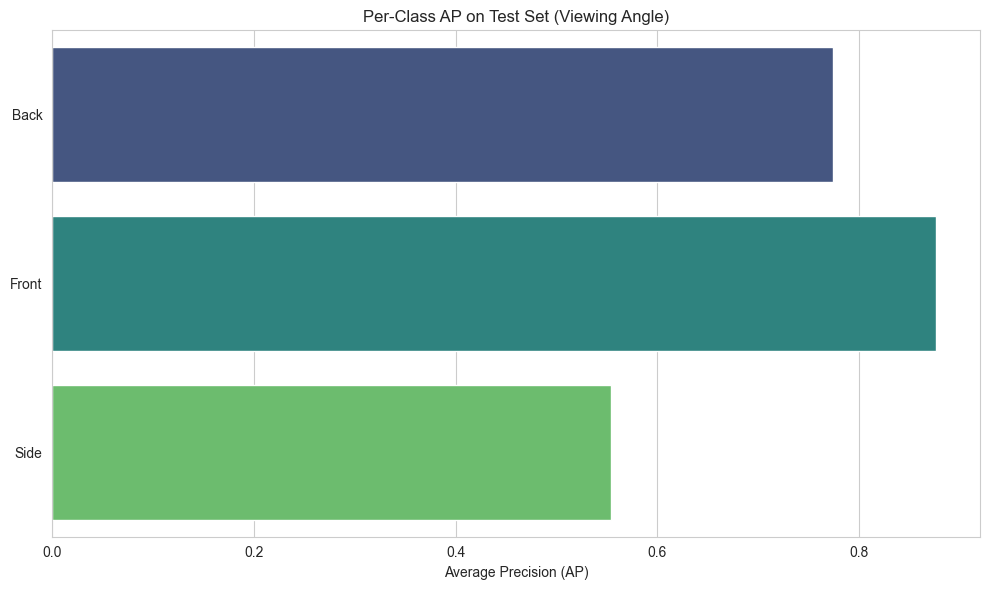

Per-class AP chart saved


In [10]:
print("TEST SET EVALUATION")

# Load best checkpoint
checkpoint = torch.load(f"{OUTPUT_DIR}/best.pth")
model.load_state_dict(checkpoint['model_state_dict'])
print(f"Loaded best checkpoint (epoch {checkpoint['epoch']+1}, val mAP: {checkpoint['val_map']:.4f})")

# Evaluate on test set with speed optimizations
data_loader_test = torch.utils.data.DataLoader(
    dataset_test, 
    batch_size=1, 
    shuffle=False,
    num_workers=0,  
    pin_memory=True,
    collate_fn=collate_fn
)

test_results = evaluate(model, data_loader_test, device, contiguous_to_cat_id)

# Handle empty results
if len(test_results) == 0:
    print("No detections on test set!")
    test_metrics = {'mAP': 0.0, 'AP50': 0.0, 'AP75': 0.0}
    per_class_ap = {name: 0.0 for name in CLASS_NAMES}
else:
    # COCO evaluation
    coco_dt_test = coco_test.loadRes(test_results)
    coco_eval = COCOeval(coco_test, coco_dt_test, 'bbox')
    coco_eval.evaluate()
    coco_eval.accumulate()
    coco_eval.summarize()

    # Extract metrics
    test_metrics = {
        'mAP': coco_eval.stats[0],
        'AP50': coco_eval.stats[1],
        'AP75': coco_eval.stats[2],
        'mAP_small': coco_eval.stats[3],
        'mAP_medium': coco_eval.stats[4],
        'mAP_large': coco_eval.stats[5]
    }

    # Display overall metrics
    print("\nOVERALL TEST METRICS")
    metrics_df = pd.DataFrame([test_metrics])
    print(metrics_df.to_string(index=False))

    # Per-class AP
    print("\nPER-CLASS AP")

    per_class_ap = {}
    for cat_id in cat_ids:
        coco_eval_cat = COCOeval(coco_test, coco_dt_test, 'bbox')
        coco_eval_cat.params.catIds = [cat_id]
        coco_eval_cat.evaluate()
        coco_eval_cat.accumulate()
        coco_eval_cat.summarize()

        cat_name = coco_test.cats[cat_id]['name']
        per_class_ap[cat_name] = coco_eval_cat.stats[0]
        print(f"{cat_name}: {per_class_ap[cat_name]:.4f}")

    # Per-class AP bar chart 
    plt.figure(figsize=(10, 6))
    sns.barplot(x=list(per_class_ap.values()), y=list(per_class_ap.keys()), palette='viridis')
    plt.xlabel('Average Precision (AP)')
    plt.title('Per-Class AP on Test Set (Viewing Angle)')
    plt.tight_layout()
    plt.savefig(f"{OUTPUT_DIR}/per_class_ap.png", dpi=150)
    plt.show()
    print(f"Per-class AP chart saved")

## Section 6: Training Curves and Monitoring

This section visualizes training dynamics through TensorBoard logs.

TRAINING CURVES


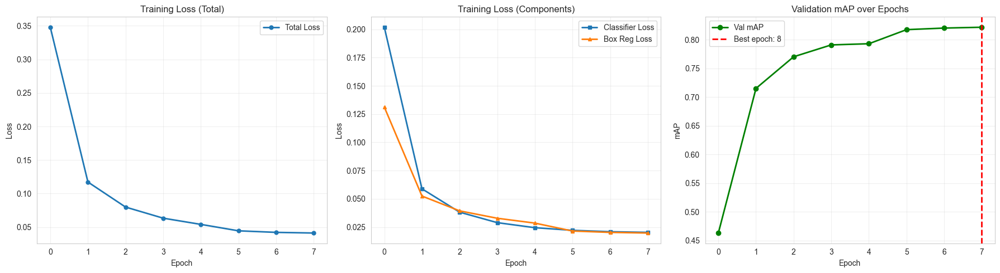

Training curves saved!


In [11]:
print("TRAINING CURVES")

# Load TensorBoard logs
ea = event_accumulator.EventAccumulator(f"{OUTPUT_DIR}/tensorboard")
ea.Reload()

# Extract scalars
train_loss_total = [(s.step, s.value) for s in ea.Scalars('Loss/train_total')]
train_loss_classifier = [(s.step, s.value) for s in ea.Scalars('Loss/train_classifier')]
train_loss_box_reg = [(s.step, s.value) for s in ea.Scalars('Loss/train_box_reg')]
val_map = [(s.step, s.value) for s in ea.Scalars('mAP/val')]

epochs_loss, loss_total_values = zip(*train_loss_total)
_, loss_classifier_values = zip(*train_loss_classifier)
_, loss_box_reg_values = zip(*train_loss_box_reg)
epochs_map, map_values = zip(*val_map)

# Plot training curves
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5))

# Total loss
ax1.plot(epochs_loss, loss_total_values, marker='o', linewidth=2, markersize=5, label='Total Loss')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.set_title('Training Loss (Total)')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Component losses
ax2.plot(epochs_loss, loss_classifier_values, marker='s', linewidth=2, markersize=5, label='Classifier Loss')
ax2.plot(epochs_loss, loss_box_reg_values, marker='^', linewidth=2, markersize=5, label='Box Reg Loss')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Loss')
ax2.set_title('Training Loss (Components)')
ax2.legend()
ax2.grid(True, alpha=0.3)

# Validation mAP
best_epoch_val = epochs_map[np.argmax(map_values)]
ax3.plot(epochs_map, map_values, marker='o', linewidth=2, markersize=6, color='green', label='Val mAP')
ax3.axvline(x=best_epoch_val, color='red', linestyle='--', linewidth=2, label=f'Best epoch: {best_epoch_val+1}')
ax3.set_xlabel('Epoch')
ax3.set_ylabel('mAP')
ax3.set_title('Validation mAP over Epochs')
ax3.legend()
ax3.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(f"{OUTPUT_DIR}/training_curves.png", dpi=150)
plt.show()
print("Training curves saved!")

## Section 7: Qualitative Results and Failure Analysis

This section shows visual predictions and analyzes failure modes.

Selected 48 test images: [70 28 67 80 29 57 23 39 68 75  1 32 31 35 16 77  7 78 18 15 22  9 14 47
 24  5  0 46 59  8 60 71 50 13 58 49 79 42  6 21 66 76 45 62 48 55 40 82]


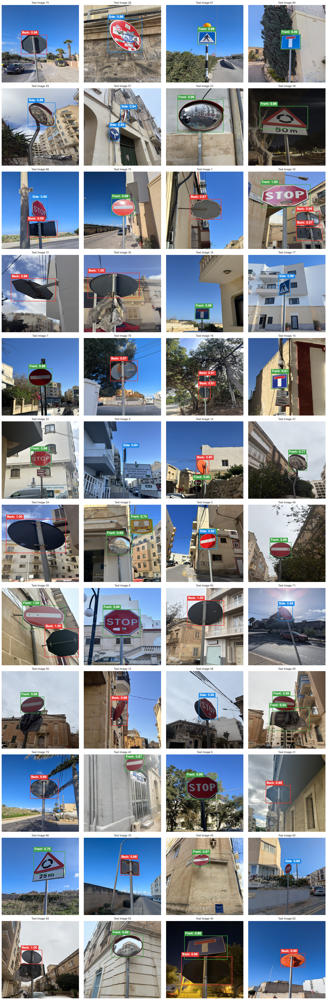

Qualitative results saved with 48 images

Computing confidence scores for histogram...
Collected 155 confidence scores


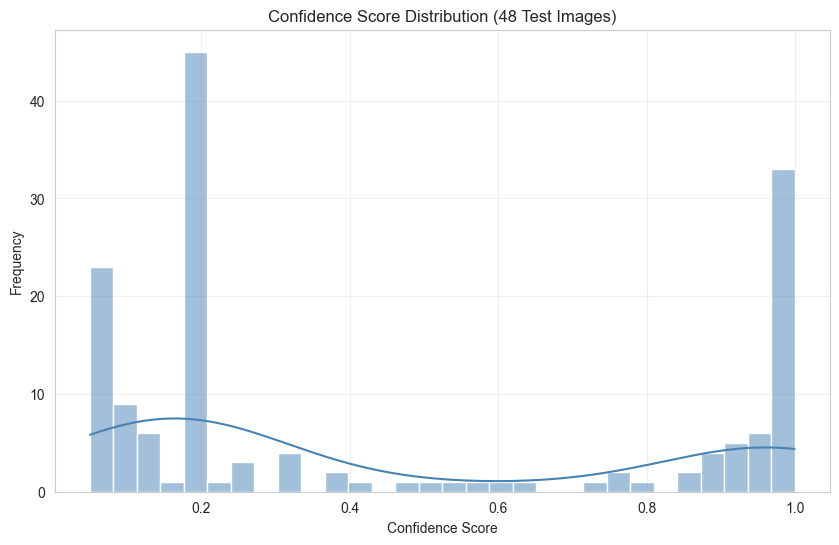

Confidence histogram saved to work_dirs/faster_rcnn_viewing_angle\confidence_histogram.png


In [16]:
def visualize_predictions(model, dataset, indices, device, contiguous_to_cat_id, class_names, threshold=0.5, cols=4):
    """Visualize predictions on selected images with category-specific colors."""
    
    # Color mapping for viewing angles (BGR format for OpenCV)
    color_map = {
        "Back": (53, 57, 229),      # Red tones (BGR)
        "Front": (71, 160, 67),     # Green tones (BGR)
        "Side": (229, 136, 30)      # Blue tones (BGR)
    }
    
    model.eval()
    num_images = len(indices)
    rows = (num_images + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows))
    if rows == 1:
        axes = axes.reshape(1, -1)
    axes = axes.flatten()
    
    with torch.no_grad():
        for i, idx in enumerate(indices):
            img, target = dataset[idx]
            img_tensor = img.unsqueeze(0).to(device)
            
            outputs = model(img_tensor)[0]
            img_np = img.permute(1, 2, 0).cpu().numpy()
            
            if img_np.max() <= 1.0:
                img_np = (img_np * 255).astype(np.uint8)
            
            img_bgr = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR)
            
            boxes = outputs['boxes'].cpu().numpy()
            labels = outputs['labels'].cpu().numpy()
            scores = outputs['scores'].cpu().numpy()
            
            for box, label, score in zip(boxes, labels, scores):
                if score >= threshold:
                    x1, y1, x2, y2 = box.astype(int)
                    class_name = class_names[label-1]
                    color_bgr = color_map.get(class_name, (255, 255, 255))
                    
                    cv2.rectangle(img_bgr, (x1, y1), (x2, y2), color_bgr, 2)
                    
                    label_text = f'{class_name}: {score:.2f}'
                    font = cv2.FONT_HERSHEY_SIMPLEX
                    font_scale = 0.6
                    font_thickness = 2
                    
                    (text_width, text_height), baseline = cv2.getTextSize(
                        label_text, font, font_scale, font_thickness
                    )
                    
                    y_text_top = max(text_height + baseline + 12, y1)
                    
                    cv2.rectangle(
                        img_bgr,
                        (x1, y_text_top - text_height - baseline - 10),
                        (x1 + text_width + 12, y_text_top),
                        color_bgr, -1
                    )
                    
                    cv2.putText(
                        img_bgr, label_text,
                        (x1 + 6, y_text_top - baseline - 5),
                        font, font_scale, (255, 255, 255), font_thickness
                    )
            
            img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
            axes[i].imshow(img_rgb)
            axes[i].set_title(f'Test Image {idx}')
            axes[i].axis('off')
        
        # Hide unused subplots
        for j in range(i + 1, len(axes)):
            axes[j].axis('off')
    
    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR, 'qualitative_results.png'), dpi=250, bbox_inches='tight')
    plt.show()
    print(f"Qualitative results saved with {num_images} images")

NUM_VIS_IMAGES = 48  
np.random.seed(SEED) 
test_image_indices = np.random.choice(len(dataset_test), size=NUM_VIS_IMAGES, replace=False)
print(f"Selected {NUM_VIS_IMAGES} test images: {test_image_indices}")

# Visualize predictions
visualize_predictions(model, dataset_test, test_image_indices, device, 
                     contiguous_to_cat_id, CLASS_NAMES, threshold=0.5, cols=4)

# Confidence score histogram
print("\nComputing confidence scores for histogram...")
model.eval()
all_scores = []

with torch.no_grad():
    for idx in test_image_indices:
        img, _ = dataset_test[idx]
        img_tensor = img.unsqueeze(0).to(device)
        outputs = model(img_tensor)[0]
        scores = outputs['scores'].cpu().numpy()
        all_scores.extend(scores)

all_scores = np.array(all_scores)
print(f"Collected {len(all_scores)} confidence scores")

plt.figure(figsize=(10, 6))
sns.histplot(all_scores, bins=30, kde=True, color='steelblue')
plt.xlabel('Confidence Score')
plt.ylabel('Frequency')
plt.title(f'Confidence Score Distribution ({NUM_VIS_IMAGES} Test Images)')
plt.grid(True, alpha=0.3)
plt.savefig(os.path.join(OUTPUT_DIR, 'confidence_histogram.png'), dpi=150, bbox_inches='tight')
plt.show()
print(f"Confidence histogram saved to {os.path.join(OUTPUT_DIR, 'confidence_histogram.png')}")

## Section 8: Per-Image Analytics

This section provides detailed per-image detection analytics on a fixed set of test images.

In [13]:
def compute_per_image_analytics(model, dataset, indices, device, class_names, threshold=0.5):
    """Compute per-image detection statistics."""
    model.eval()
    analytics = []
    
    with torch.no_grad():
        for idx in indices:
            img, target = dataset[idx]
            img_tensor = img.unsqueeze(0).to(device)
            
            # Run inference
            outputs = model(img_tensor)[0]
            
            # Filter by threshold
            boxes = outputs['boxes'].cpu().numpy()
            labels = outputs['labels'].cpu().numpy()
            scores = outputs['scores'].cpu().numpy()
            
            mask = scores >= threshold
            filtered_labels = labels[mask]
            filtered_scores = scores[mask]
            
            # Count detections
            total_detections = len(filtered_labels)
            
            # Breakdown by class
            class_counts = {}
            for class_idx, class_name in enumerate(class_names, start=1):
                count = np.sum(filtered_labels == class_idx)
                class_counts[class_name] = int(count)
            
            # Mean confidence
            mean_confidence = float(np.mean(filtered_scores)) if len(filtered_scores) > 0 else 0.0
            
            analytics.append({
                'Image_Index': idx,
                'Total_Detections': total_detections,
                'Mean_Confidence': mean_confidence,
                **class_counts
            })
    
    return pd.DataFrame(analytics)

# Select 10 test images for analytics
np.random.seed(SEED)
analytics_indices = np.random.choice(len(dataset_test), size=10, replace=False)
print(f"Selected {len(analytics_indices)} test images for analytics")

# Compute analytics
analytics_df = compute_per_image_analytics(model, dataset_test, analytics_indices, 
                                          device, CLASS_NAMES, threshold=0.5)

# Display table
print("\nPer-Image Analytics (Viewing Angle)")
print(analytics_df.to_string(index=False))

# Save to CSV
csv_path = os.path.join(OUTPUT_DIR, 'per_image_analytics.csv')
analytics_df.to_csv(csv_path, index=False)
print(f"\nPer-image analytics saved to {csv_path}")

Selected 10 test images for analytics

Per-Image Analytics (Viewing Angle)
 Image_Index  Total_Detections  Mean_Confidence  Back  Front  Side
          70                 1         0.962611     1      0     0
          28                 1         0.878682     0      0     1
          67                 1         0.979118     0      1     0
          80                 1         0.991078     0      1     0
          29                 1         0.887293     0      0     1
          57                 2         0.944853     0      0     2
          23                 1         0.994899     0      1     0
          39                 1         0.981439     0      1     0
          68                 2         0.789719     1      0     1
          75                 1         0.993341     0      1     0

Per-image analytics saved to work_dirs/faster_rcnn_viewing_angle\per_image_analytics.csv


## Section 9: Inference Speed Measurement

This section measures model inference speed using a standardized protocol.

In [14]:
def measure_speed(model, dataset, device, num_warmup=10, num_samples=100):
    """Measure inference speed with standardized protocol."""
    model.eval()
    
    # Prepare images on CPU 
    images = []
    for i in range(num_warmup + num_samples):
        idx = i % len(dataset)
        img, _ = dataset[idx]
        images.append(img.unsqueeze(0))  # Keep on CPU
    
    print(f"Warmup: {num_warmup} iterations")
    with torch.no_grad():
        for i in range(num_warmup):
            img_gpu = images[i].to(device)
            _ = model(img_gpu)
    
    print(f"Timing: {num_samples} iterations")
    latencies = []
    
    with torch.no_grad():
        for i in range(num_warmup, num_warmup + num_samples):
            # CUDA sync only if device is CUDA
            if device.type == 'cuda':
                torch.cuda.synchronize()
            
            start = time.time()
            
            # Move to GPU and run inference
            img_gpu = images[i].to(device)
            _ = model(img_gpu)
            
            if device.type == 'cuda':
                torch.cuda.synchronize()
            
            end = time.time()
            latencies.append((end - start) * 1000)  # Convert to ms
    
    latencies = np.array(latencies)
    mean_latency = np.mean(latencies)
    std_latency = np.std(latencies)
    fps = 1000.0 / mean_latency
    
    return {
        'mean_latency_ms': mean_latency,
        'std_latency_ms': std_latency,
        'FPS': fps
    }

print("INFERENCE SPEED MEASUREMENT:")
print(f"Device: {device}")
print(f"Batch size: 1 (single image inference)")
print(f"Training batch size: {BATCH_SIZE}")
print(f"Warmup iterations: 10")
print(f"Timed samples: 100")

speed_results = measure_speed(model, dataset_test, device, num_warmup=10, num_samples=100)

print("\nSpeed Results:")
print(f"Mean latency: {speed_results['mean_latency_ms']:.2f} +/- {speed_results['std_latency_ms']:.2f} ms")
print(f"FPS: {speed_results['FPS']:.2f}")

INFERENCE SPEED MEASUREMENT:
Device: cuda
Batch size: 1 (single image inference)
Training batch size: 8
Warmup iterations: 10
Timed samples: 100
Warmup: 10 iterations
Timing: 100 iterations

Speed Results:
Mean latency: 53.98 +/- 3.50 ms
FPS: 18.53


## Section 10: Results Export 

This section exports all results to a standardized JSON format for cross-model comparison.

In [15]:
# Count model parameters
num_params = sum(p.numel() for p in model.parameters())
print(f"Total parameters: {num_params:,}")

# Get checkpoint file size
best_checkpoint_path = os.path.join(OUTPUT_DIR, 'best.pth')
checkpoint_size_mb = os.path.getsize(best_checkpoint_path) / (1024 * 1024)
print(f"Checkpoint size: {checkpoint_size_mb:.2f} MB")

# Build export dictionary 
results_export = {
    "student": "BenTaliana",
    "model_name": "faster_rcnn_r50_fpn",
    "task": "viewing_angle",
    "framework": "torchvision",
    "framework_version": torchvision.__version__,
    
    "dataset": {
        "name": "MTSD",
        "num_classes": NUM_CLASSES,
        "class_names": CLASS_NAMES,
        "train_images": len(coco_train.imgs),
        "val_images": len(coco_val.imgs),
        "test_images": len(coco_test.imgs)
    },
    
    "training": {
        "epochs": EPOCHS,
        "batch_size": BATCH_SIZE,
        "learning_rate": LEARNING_RATE,
        "image_size": "520x520",
        "augmentation": "Resize(520x520) + ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2)",
        "pretrained": "COCO",
        "seed": SEED,
        "total_time_hours": round(training_time / 3600, 2),
        "best_epoch": best_epoch + 1,
        "best_val_map": round(best_map, 4)
    },
    
    "metrics": {
        "mAP": round(test_metrics['mAP'], 4),
        "AP50": round(test_metrics['AP50'], 4),
        "AP75": round(test_metrics['AP75'], 4),
        "per_class_AP": {name: round(ap, 4) for name, ap in per_class_ap.items()}
    },
    
    "model_complexity": {
        "num_parameters": num_params,
        "checkpoint_size_mb": round(checkpoint_size_mb, 2)
    },
    
    "speed": {
        "device": str(device),
        "batch_size": 1,
        "num_warmup": 10,
        "num_samples": 100,
        "mean_latency_ms": round(speed_results['mean_latency_ms'], 2),
        "std_latency_ms": round(speed_results['std_latency_ms'], 2),
        "FPS": round(speed_results['FPS'], 2),
        "includes_preprocessing": False
    },
    
    "artifacts": {
        "work_dir": OUTPUT_DIR,
        "checkpoint_best": os.path.join(OUTPUT_DIR, "best.pth"),
        "checkpoint_last": os.path.join(OUTPUT_DIR, "last.pth"),
        "tensorboard_logdir": os.path.join(OUTPUT_DIR, "tensorboard"),
        
        "plots": {
            "training_curves": os.path.join(OUTPUT_DIR, "training_curves.png"),
            "per_class_ap_chart": os.path.join(OUTPUT_DIR, "per_class_ap.png"),
            "qualitative_grid": os.path.join(OUTPUT_DIR, "qualitative_results.png"),
            "confidence_histogram": os.path.join(OUTPUT_DIR, "confidence_histogram.png"),
            "precision_recall_curve": None,
            "confusion_matrix": None
        }
    }
}

# Save to JSON
export_path = os.path.join(OUTPUT_DIR, 'results_export.json')
with open(export_path, 'w') as f:
    json.dump(results_export, f, indent=2)

print(f"Results exported to: {export_path}")


# Display summary
print("\nEXPORT SUMMARY:")
print(f"Student: {results_export['student']}")
print(f"Model: {results_export['model_name']}")
print(f"Task: {results_export['task']}")
print(f"Test mAP: {results_export['metrics']['mAP']:.4f}")
print(f"Parameters: {results_export['model_complexity']['num_parameters']:,}")
print(f"Speed: {results_export['speed']['FPS']:.2f} FPS")

Total parameters: 41,309,411
Checkpoint size: 314.82 MB
Results exported to: work_dirs/faster_rcnn_viewing_angle\results_export.json

EXPORT SUMMARY:
Student: BenTaliana
Model: faster_rcnn_r50_fpn
Task: viewing_angle
Test mAP: 0.7349
Parameters: 41,309,411
Speed: 18.53 FPS
